In [10]:
#from influxdb import InfluxDBClient, DataFrameClient
import pandas as pd
import matplotlib.pyplot as plt
import select
import time
import datetime

In [90]:
client = InfluxDBClient(host='localhost', port=8086, database='Test Database')

In [91]:
client.ping()

'1.8.0'

In [92]:
client.get_list_database()

[{'name': '_internal'}, {'name': 'testdb'}, {'name': 'Test Database'}]

In [93]:
query = client.query("SELECT delay FROM Client")

In [94]:
n, data = query.items()[0]

In [95]:
delay = [d['delay'] for d in  data]

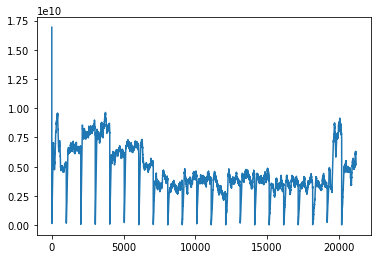

In [96]:
plt.plot(delay)

In [97]:
query = client.query("SELECT fps FROM Client")
n, data = query.items()[0]
fps = [d['fps'] for d in  data]

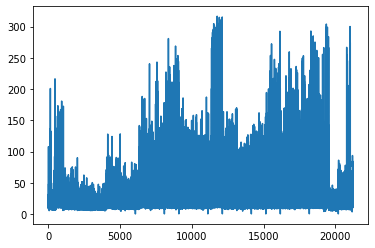

In [98]:
plt.plot(fps)

In [1]:
streaming = True
data_list = []
with open("/home/evangelos/temp") as fifo:
    print("FIFO opened")
    while streaming:
        for line in fifo:
            if len(line)>0:
                data_list.append(line)
            else:
                streaming=False
    print("Out of Loop")
            #write point in db
            # but i need bitrate

FIFO opened


KeyboardInterrupt: 

In [2]:
data_list

['20:37:48.943947 IP6 localhost.ddi-tcp-1 > localhost.50818: Flags [P.], seq 175513321:175513323, ack 2938165364, win 512, options [nop,nop,TS val 1572344077 ecr 1572314078], length 2\n',
 '20:37:48.943971 IP6 localhost.50818 > localhost.ddi-tcp-1: Flags [.], ack 2, win 512, options [nop,nop,TS val 1572344077 ecr 1572344077], length 0\n',
 '20:37:48.944030 IP6 localhost.50818 > localhost.ddi-tcp-1: Flags [P.], seq 1:7, ack 2, win 512, options [nop,nop,TS val 1572344077 ecr 1572344077], length 6\n',
 '20:37:48.944041 IP6 localhost.ddi-tcp-1 > localhost.50818: Flags [.], ack 7, win 512, options [nop,nop,TS val 1572344077 ecr 1572344077], length 0\n',
 '20:37:49.780745 IP localhost.60770 > localhost.personal-agent: Flags [S], seq 2876855930, win 65495, options [mss 65495,sackOK,TS val 481790820 ecr 0,nop,wscale 7], length 0\n',
 '20:37:49.780760 IP localhost.personal-agent > localhost.60770: Flags [R.], seq 0, ack 2876855931, win 0, length 0\n',
 '20:37:49.964098 IP localhost.60772 > loca

In [11]:
filtered = [(d.split(' ')[0], d.split(' ')[-1][:-1]) for d in data_list]

In [23]:
def get_time(line):
    return datetime.datetime.strptime(line.split(" ")[0], '%H:%M:%S.%f')
def get_length(line):
    print(line.split(" "))
    return int(line.split(" ")[-1][:-1])

In [24]:
time_len = [(get_time(d), get_length(d)) for d in data_list]

['20:37:48.943947', 'IP6', 'localhost.ddi-tcp-1', '>', 'localhost.50818:', 'Flags', '[P.],', 'seq', '175513321:175513323,', 'ack', '2938165364,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '1572344077', 'ecr', '1572314078],', 'length', '2\n']
['20:37:48.943971', 'IP6', 'localhost.50818', '>', 'localhost.ddi-tcp-1:', 'Flags', '[.],', 'ack', '2,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '1572344077', 'ecr', '1572344077],', 'length', '0\n']
['20:37:48.944030', 'IP6', 'localhost.50818', '>', 'localhost.ddi-tcp-1:', 'Flags', '[P.],', 'seq', '1:7,', 'ack', '2,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '1572344077', 'ecr', '1572344077],', 'length', '6\n']
['20:37:48.944041', 'IP6', 'localhost.ddi-tcp-1', '>', 'localhost.50818:', 'Flags', '[.],', 'ack', '7,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '1572344077', 'ecr', '1572344077],', 'length', '0\n']
['20:37:49.780745', 'IP', 'localhost.60770', '>', 'localhost.personal-agent:', 'Flags', '[S],', 'seq', '2876855930,

['20:38:01.853491', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2106416508,', 'win', '7207,', 'options', '[nop,nop,TS', 'val', '481802893', 'ecr', '481802892,nop,nop,sack', '1', '{2106809406:2106940372}],', 'length', '0\n']
['20:38:01.853495', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2106481991,', 'win', '6696,', 'options', '[nop,nop,TS', 'val', '481802893', 'ecr', '481802892,nop,nop,sack', '1', '{2106809406:2106940372}],', 'length', '0\n']
['20:38:01.853498', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2106547474,', 'win', '6185,', 'options', '[nop,nop,TS', 'val', '481802893', 'ecr', '481802892,nop,nop,sack', '1', '{2106809406:2106940372}],', 'length', '0\n']
['20:38:01.853502', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2106547474,', 'win', '6185,', 'options', '[nop,nop,TS', 'val', '481802893', 'ecr', '481802892,nop,nop,sa

['20:38:02.522127', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2214398808:2214464291,', 'ack', '5418,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481803561', 'ecr', '481803561],', 'length', '65483\n']
['20:38:02.522162', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2214464291:2214529774,', 'ack', '5418,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481803561', 'ecr', '481803561],', 'length', '65483\n']
['20:38:02.522168', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2214529774,', 'win', '24316,', 'options', '[nop,nop,TS', 'val', '481803561', 'ecr', '481803561],', 'length', '0\n']
['20:38:02.522198', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2214529774:2214595257,', 'ack', '5418,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481803561', 'ecr', '481803561],', 'length', '65483\n']
['20:38:02.522240', 'IP', 'localh

['20:38:03.464035', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2378762461:2378827944,', 'ack', '5823,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481804503', 'ecr', '481804503],', 'length', '65483\n']
['20:38:03.464076', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2378827944:2378893427,', 'ack', '5823,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481804503', 'ecr', '481804503],', 'length', '65483\n']
['20:38:03.464123', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2378893427:2378958910,', 'ack', '5823,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481804503', 'ecr', '481804503],', 'length', '65483\n']
['20:38:03.464170', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2378958910:2379024393,', 'ack', '5823,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481804503', 'ecr', '481804503],', 'length', '65483\n']
['20

['20:38:04.364368', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2507895966,', 'win', '24316,', 'options', '[nop,nop,TS', 'val', '481805403', 'ecr', '481805403],', 'length', '0\n']
['20:38:04.364405', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2507895966:2507961449,', 'ack', '6138,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481805403', 'ecr', '481805401],', 'length', '65483\n']
['20:38:04.364441', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2507961449:2508026932,', 'ack', '6138,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481805403', 'ecr', '481805401],', 'length', '65483\n']
['20:38:04.364477', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2508026932:2508092415,', 'ack', '6138,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481805404', 'ecr', '481805401],', 'length', '65483\n']
['20:38:04.364531', 'IP', 'localh

['20:38:04.910006', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2594334212:2594399695,', 'ack', '6348,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481805949', 'ecr', '481805947],', 'length', '65483\n']
['20:38:04.910037', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2594399695:2594465178,', 'ack', '6348,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481805949', 'ecr', '481805947],', 'length', '65483\n']
['20:38:04.910068', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2594465178:2594530661,', 'ack', '6348,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481805949', 'ecr', '481805947],', 'length', '65483\n']
['20:38:04.910100', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2594530661:2594596144,', 'ack', '6348,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481805949', 'ecr', '481805947],', 'length', '65483\n']
['20

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




['20:38:13.960378', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '4104384050:4104449533,', 'ack', '9978,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481814999', 'ecr', '481814999],', 'length', '65483\n']
['20:38:13.960433', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '4104449533:4104515016,', 'ack', '9978,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481814999', 'ecr', '481814999],', 'length', '65483\n']
['20:38:13.960450', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '4104515016,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481815000', 'ecr', '481814999],', 'length', '0\n']
['20:38:13.960497', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '4104515016:4104580499,', 'ack', '9978,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481815000', 'ecr', '481814999],', 'length', '65483\n']
['20:38:13.960556', 'IP', 'local

['20:38:14.615455', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '4238035931:4238101414,', 'ack', '10308,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481815655', 'ecr', '481815654],', 'length', '65483\n']
['20:38:14.615492', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '4238101414:4238166897,', 'ack', '10308,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481815655', 'ecr', '481815654],', 'length', '65483\n']
['20:38:14.615489', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '4238101414,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481815655', 'ecr', '481815654],', 'length', '0\n']
['20:38:14.615525', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '4238166897:4238232380,', 'ack', '10308,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481815655', 'ecr', '481815654],', 'length', '65483\n']
['20:38:14.615554', 'IP', 'loc

['20:38:15.303261', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '57075420,', 'win', '24316,', 'options', '[nop,nop,TS', 'val', '481816342', 'ecr', '481816342],', 'length', '0\n']
['20:38:15.303330', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '57075420:57140903,', 'ack', '10578,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481816342', 'ecr', '481816341],', 'length', '65483\n']
['20:38:15.303434', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '57140903:57206386,', 'ack', '10578,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481816342', 'ecr', '481816341],', 'length', '65483\n']
['20:38:15.303447', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '57206386,', 'win', '24316,', 'options', '[nop,nop,TS', 'val', '481816343', 'ecr', '481816342],', 'length', '0\n']
['20:38:15.303526', 'IP', 'localhost.60806', '>', 'localhost.personal-ag

['20:38:16.195486', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '209913967:209979450,', 'ack', '10953,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481817235', 'ecr', '481817232],', 'length', '65483\n']
['20:38:16.195524', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '209979450:210044933,', 'ack', '10953,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481817235', 'ecr', '481817232],', 'length', '65483\n']
['20:38:16.195571', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '210044933:210110416,', 'ack', '10953,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481817235', 'ecr', '481817234],', 'length', '65483\n']
['20:38:16.195603', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '210110416:210175899,', 'ack', '10953,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481817235', 'ecr', '481817234],', 'length', '65483\n']
['20:38:

['20:38:16.929725', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '317372403:317437886,', 'ack', '11208,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481817969', 'ecr', '481817968],', 'length', '65483\n']
['20:38:16.929755', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '317437886:317503369,', 'ack', '11208,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481817969', 'ecr', '481817968],', 'length', '65483\n']
['20:38:16.929761', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '317503369,', 'win', '24316,', 'options', '[nop,nop,TS', 'val', '481817969', 'ecr', '481817969],', 'length', '0\n']
['20:38:16.929791', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '317503369:317568852,', 'ack', '11208,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481817969', 'ecr', '481817968],', 'length', '65483\n']
['20:38:16.929821', 'IP', 'localhost.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['20:38:27.121859', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '1865009826,', 'win', '24316,', 'options', '[nop,nop,TS', 'val', '481828161', 'ecr', '481828161],', 'length', '0\n']
['20:38:27.121906', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '1865009826:1865075309,', 'ack', '14943,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481828161', 'ecr', '481828161],', 'length', '65483\n']
['20:38:27.121953', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '1865075309:1865140792,', 'ack', '14943,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481828161', 'ecr', '481828161],', 'length', '65483\n']
['20:38:27.121968', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '1865140792,', 'win', '24316,', 'options', '[nop,nop,TS', 'val', '481828161', 'ecr', '481828161],', 'length', '0\n']
['20:38:27.122018', 'IP', 'localhost.60806', '>', 'localhost

['20:38:28.031710', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '1998596175:1998661658,', 'ack', '15258,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481829071', 'ecr', '481829071],', 'length', '65483\n']
['20:38:28.031737', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '1998661658:1998727141,', 'ack', '15258,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481829071', 'ecr', '481829071],', 'length', '65483\n']
['20:38:28.031765', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '1998727141:1998792624,', 'ack', '15258,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481829071', 'ecr', '481829071],', 'length', '65483\n']
['20:38:28.031792', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '1998792624:1998858107,', 'ack', '15258,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481829071', 'ecr', '481829071],', 'length', '65483\n']


['20:38:29.167247', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2142987317:2143052800,', 'ack', '15603,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481830206', 'ecr', '481830206],', 'length', '65483\n']
['20:38:29.167313', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2143052800:2143118283,', 'ack', '15603,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481830206', 'ecr', '481830206],', 'length', '65483\n']
['20:38:29.167367', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2143118283,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481830206', 'ecr', '481830206],', 'length', '0\n']
['20:38:29.167418', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2143118283:2143183766,', 'ack', '15603,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481830206', 'ecr', '481830206],', 'length', '65483\n']
['20:38:29.167503', 'IP', 'loc

['20:38:29.962645', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2247695467:2247760950,', 'ack', '15858,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481831002', 'ecr', '481831001],', 'length', '65483\n']
['20:38:29.962739', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2247760950:2247826433,', 'ack', '15858,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481831002', 'ecr', '481831001],', 'length', '65483\n']
['20:38:29.962814', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2247826433:2247891916,', 'ack', '15858,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481831002', 'ecr', '481831001],', 'length', '65483\n']
['20:38:29.962881', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[P.],', 'seq', '2247891916:2247957399,', 'ack', '15858,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481831002', 'ecr', '481831001],', 'length', '65483\n']

['20:38:30.678815', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2351028474,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481831718', 'ecr', '481831718],', 'length', '0\n']
['20:38:30.678978', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2351093957:2351159440,', 'ack', '16113,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481831718', 'ecr', '481831718],', 'length', '65483\n']
['20:38:30.679059', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2351159440,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481831718', 'ecr', '481831718],', 'length', '0\n']
['20:38:30.679071', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2351159440:2351224923,', 'ack', '16113,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481831718', 'ecr', '481831718],', 'length', '65483\n']
['20:38:30.679176', 'IP', 'localhost.60806', '>', 'localhost

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [25]:
timestamps = [get_time(line) for line in data_list]

In [26]:
def time_diff(dt1, dt2):
    sec = dt2.second - dt1.second
    u_sec = dt2.microsecond - dt1.microsecond
    return sec + u_sec/1000

In [27]:
from itertools import tee
def pairwise(iterable):
    "s -> (s0,s1), (s1,s2), (s2, s3), ..."
    a, b = tee(iterable)
    next(b, None)
    return zip(a, b)

In [28]:
diffs = [time_diff(dt2, dt1) for dt1, dt2 in pairwise(timestamps)]

In [29]:
diffs

[-0.024,
 -0.059,
 -0.011,
 162.296,
 -0.015,
 -183.338,
 -0.018,
 873.795,
 -0.022,
 -141.268,
 -0.014,
 -186.312,
 -0.012,
 -197.326,
 -0.013,
 -110.196,
 -0.009,
 -138.327,
 -0.035,
 835.554,
 -0.034,
 -140.36,
 -0.021,
 -172.244,
 -0.022,
 -111.331,
 -0.023,
 -115.288,
 -0.019,
 -182.306,
 -0.012,
 -110.208,
 -0.009,
 -115.104,
 -0.011,
 -17.435,
 -0.016,
 -0.013,
 -0.039,
 -0.007,
 -0.449,
 -0.012,
 -0.394,
 -0.014,
 888.143,
 -0.012,
 -0.011,
 -0.119,
 -0.009,
 -0.024,
 -0.009,
 -0.024,
 -0.01,
 -0.038,
 -0.006,
 -0.016,
 -0.005,
 -0.065,
 -0.009,
 -0.025,
 -0.007,
 -0.135,
 -0.012,
 -0.036,
 -0.076,
 -0.007,
 -0.017,
 -0.02,
 -0.01,
 -0.005,
 -0.003,
 -0.009,
 0.001,
 -0.008,
 -0.013,
 -0.015,
 -0.012,
 -0.012,
 -0.014,
 -0.016,
 -0.012,
 -0.013,
 -0.016,
 -0.013,
 -0.022,
 -0.008,
 -0.006,
 -0.006,
 -0.195,
 -0.014,
 -0.012,
 -0.013,
 -0.013,
 -0.004,
 -0.008,
 0.001,
 -0.006,
 -0.006,
 -0.001,
 -0.005,
 -0.007,
 0.0,
 -0.005,
 -0.017,
 -0.005,
 -0.404,
 -0.008,
 -0.018,
 -0.01

In [30]:
bit_rate = [get_length(l)*d/1000 for l,d in zip(data_list[1:], diffs)]

['20:37:48.943971', 'IP6', 'localhost.50818', '>', 'localhost.ddi-tcp-1:', 'Flags', '[.],', 'ack', '2,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '1572344077', 'ecr', '1572344077],', 'length', '0\n']
['20:37:48.944030', 'IP6', 'localhost.50818', '>', 'localhost.ddi-tcp-1:', 'Flags', '[P.],', 'seq', '1:7,', 'ack', '2,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '1572344077', 'ecr', '1572344077],', 'length', '6\n']
['20:37:48.944041', 'IP6', 'localhost.ddi-tcp-1', '>', 'localhost.50818:', 'Flags', '[.],', 'ack', '7,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '1572344077', 'ecr', '1572344077],', 'length', '0\n']
['20:37:49.780745', 'IP', 'localhost.60770', '>', 'localhost.personal-agent:', 'Flags', '[S],', 'seq', '2876855930,', 'win', '65495,', 'options', '[mss', '65495,sackOK,TS', 'val', '481790820', 'ecr', '0,nop,wscale', '7],', 'length', '0\n']
['20:37:49.780760', 'IP', 'localhost.personal-agent', '>', 'localhost.60770:', 'Flags', '[R.],', 'seq', '0,', 'ack', '28768

['20:38:01.684237', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2063459317:2063524800,', 'ack', '5058,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481802723', 'ecr', '481802723],', 'length', '65483\n']
['20:38:01.684266', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2063524800:2063590283,', 'ack', '5058,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481802723', 'ecr', '481802723],', 'length', '65483\n']
['20:38:01.684293', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2063590283:2063655766,', 'ack', '5058,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481802723', 'ecr', '481802723],', 'length', '65483\n']
['20:38:01.684321', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2063655766:2063721249,', 'ack', '5058,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481802723', 'ecr', '481802723],', 'length', '65483\n']
['20

['20:38:02.021160', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2133657632:2133723115,', 'ack', '5223,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481803060', 'ecr', '481803057],', 'length', '65483\n']
['20:38:02.021260', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[P.],', 'seq', '2133723115:2133780455,', 'ack', '5223,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481803060', 'ecr', '481803057],', 'length', '57340\n']
['20:38:02.021291', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2133780455,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481803060', 'ecr', '481803060],', 'length', '0\n']
['20:38:02.036700', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[P.],', 'seq', '5223:5238,', 'ack', '2133780455,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481803076', 'ecr', '481803060],', 'length', '15\n']
['20:38:02.040392', 'IP', 'localhost.6

['20:38:02.322071', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2191872509:2191937992,', 'ack', '5373,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481803361', 'ecr', '481803361],', 'length', '65483\n']
['20:38:02.322092', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2191937992,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481803361', 'ecr', '481803361],', 'length', '0\n']
['20:38:02.322106', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2191937992:2192003475,', 'ack', '5373,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481803361', 'ecr', '481803361],', 'length', '65483\n']
['20:38:02.322137', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2192003475:2192068958,', 'ack', '5373,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481803361', 'ecr', '481803361],', 'length', '65483\n']
['20:38:02.322159', 'IP', 'localh

['20:38:02.708888', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2248777677:2248843160,', 'ack', '5508,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481803748', 'ecr', '481803747],', 'length', '65483\n']
['20:38:02.708937', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[P.],', 'seq', '2248843160:2248908643,', 'ack', '5508,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481803748', 'ecr', '481803747],', 'length', '65483\n']
['20:38:02.708942', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2248777677,', 'win', '24316,', 'options', '[nop,nop,TS', 'val', '481803748', 'ecr', '481803748],', 'length', '0\n']
['20:38:02.708967', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2248908643,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481803748', 'ecr', '481803748],', 'length', '0\n']
['20:38:02.708996', 'IP', 'localhost.60806', '>', 'localhost.

['20:38:03.769810', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2408557471:2408622954,', 'ack', '5898,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481804809', 'ecr', '481804809],', 'length', '65483\n']
['20:38:03.769839', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2408622954:2408688437,', 'ack', '5898,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481804809', 'ecr', '481804809],', 'length', '65483\n']
['20:38:03.769839', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2408622954,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481804809', 'ecr', '481804809],', 'length', '0\n']
['20:38:03.769864', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2408688437:2408753920,', 'ack', '5898,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481804809', 'ecr', '481804809],', 'length', '65483\n']
['20:38:03.769886', 'IP', 'localh

['20:38:04.300364', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2488447368,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481805339', 'ecr', '481805339],', 'length', '0\n']
['20:38:04.300375', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2488447368:2488512851,', 'ack', '6093,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481805339', 'ecr', '481805337],', 'length', '65483\n']
['20:38:04.300406', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2488512851:2488578334,', 'ack', '6093,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481805339', 'ecr', '481805337],', 'length', '65483\n']
['20:38:04.300426', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2488578334,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481805339', 'ecr', '481805339],', 'length', '0\n']
['20:38:04.300440', 'IP', 'localhost.60806', '>', 'localhost.p

['20:38:04.631637', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2557925370:2557990853,', 'ack', '6258,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481805671', 'ecr', '481805671],', 'length', '65483\n']
['20:38:04.631677', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2557990853:2558056336,', 'ack', '6258,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481805671', 'ecr', '481805671],', 'length', '65483\n']
['20:38:04.631686', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2558056336,', 'win', '24316,', 'options', '[nop,nop,TS', 'val', '481805671', 'ecr', '481805671],', 'length', '0\n']
['20:38:04.631721', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2558056336:2558121819,', 'ack', '6258,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481805671', 'ecr', '481805671],', 'length', '65483\n']
['20:38:04.631768', 'IP', 'localh

['20:38:04.978705', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2616009232:2616074715,', 'ack', '6393,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481806017', 'ecr', '481806017],', 'length', '65483\n']
['20:38:04.978723', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2616074715:2616140198,', 'ack', '6393,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481806017', 'ecr', '481806017],', 'length', '65483\n']
['20:38:04.978736', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2616925994:2616991477,', 'ack', '6393,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481806018', 'ecr', '481806017],', 'length', '65483\n']
['20:38:04.978740', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2616205681:2616271164,', 'ack', '6393,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481806017', 'ecr', '481806017],', 'length', '65483\n']
['20

['20:38:05.449299', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2702120063,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481806488', 'ecr', '481806488],', 'length', '0\n']
['20:38:05.449327', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2702185546:2702251029,', 'ack', '6603,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481806488', 'ecr', '481806488],', 'length', '65483\n']
['20:38:05.449356', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2702251029,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481806488', 'ecr', '481806488],', 'length', '0\n']
['20:38:05.449363', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2702251029:2702316512,', 'ack', '6603,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481806488', 'ecr', '481806488],', 'length', '65483\n']
['20:38:05.449410', 'IP', 'localhost.60806', '>', 'localhost.p

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['20:38:16.440618', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '242786678,', 'win', '24316,', 'options', '[nop,nop,TS', 'val', '481817480', 'ecr', '481817480],', 'length', '0\n']
['20:38:16.440635', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '242852161:242917644,', 'ack', '11028,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481817480', 'ecr', '481817479],', 'length', '65483\n']
['20:38:16.440676', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '242917644:242983127,', 'ack', '11028,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481817480', 'ecr', '481817479],', 'length', '65483\n']
['20:38:16.440683', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '242917644,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481817480', 'ecr', '481817480],', 'length', '0\n']
['20:38:16.440724', 'IP', 'localhost.60806', '>', 'localhost.perso

['20:38:17.463561', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '389273276,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481818503', 'ecr', '481818502],', 'length', '0\n']
['20:38:17.463668', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '389273276:389338759,', 'ack', '11373,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481818503', 'ecr', '481818500],', 'length', '65483\n']
['20:38:17.463847', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[P.],', 'seq', '389338759:389396099,', 'ack', '11373,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481818503', 'ecr', '481818500],', 'length', '57340\n']
['20:38:17.463892', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '389396099,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481818503', 'ecr', '481818503],', 'length', '0\n']
['20:38:17.536322', 'IP', 'localhost.personal-agent', '>', 'local

['20:38:17.771224', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '437862054,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481818810', 'ecr', '481818810],', 'length', '0\n']
['20:38:17.771232', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '437862054:437927537,', 'ack', '11493,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481818810', 'ecr', '481818810],', 'length', '65483\n']
['20:38:17.771266', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '437927537:437993020,', 'ack', '11493,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481818810', 'ecr', '481818810],', 'length', '65483\n']
['20:38:17.771288', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '437993020,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481818810', 'ecr', '481818810],', 'length', '0\n']
['20:38:17.771298', 'IP', 'localhost.60806', '>', 'localhost.perso

['20:38:18.465684', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '539099605:539165088,', 'ack', '11748,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481819505', 'ecr', '481819503],', 'length', '65483\n']
['20:38:18.465740', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '539165088:539230571,', 'ack', '11748,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481819505', 'ecr', '481819503],', 'length', '65483\n']
['20:38:18.465791', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '539230571:539296054,', 'ack', '11748,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481819505', 'ecr', '481819503],', 'length', '65483\n']
['20:38:18.465847', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '539296054:539361537,', 'ack', '11748,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481819505', 'ecr', '481819503],', 'length', '65483\n']
['20:38:

['20:38:18.783749', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '576490692,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481819823', 'ecr', '481819823],', 'length', '0\n']
['20:38:18.785325', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '576556175:576621658,', 'ack', '11838,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481819824', 'ecr', '481819819],', 'length', '65483\n']
['20:38:18.785612', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '576621658:576687141,', 'ack', '11838,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481819825', 'ecr', '481819819],', 'length', '65483\n']
['20:38:18.785756', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '576687141:576752624,', 'ack', '11838,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481819825', 'ecr', '481819819],', 'length', '65483\n']
['20:38:18.785848', 'IP', 'localhost.

['20:38:19.219741', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '671638226:671703709,', 'ack', '12063,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481820259', 'ecr', '481820258],', 'length', '65483\n']
['20:38:19.220124', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '671703709:671769192,', 'ack', '12063,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481820259', 'ecr', '481820258],', 'length', '65483\n']
['20:38:19.220174', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '671769192,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481820259', 'ecr', '481820259],', 'length', '0\n']
['20:38:19.220190', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '671769192:671834675,', 'ack', '12063,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481820259', 'ecr', '481820258],', 'length', '65483\n']
['20:38:19.220269', 'IP', 'localhost.

['20:38:19.512387', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[P.],', 'seq', '722191494:722256977,', 'ack', '12183,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481820551', 'ecr', '481820551],', 'length', '65483\n']
['20:38:19.512407', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '722256977,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481820551', 'ecr', '481820551],', 'length', '0\n']
['20:38:19.512448', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '722256977:722322460,', 'ack', '12183,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481820551', 'ecr', '481820551],', 'length', '65483\n']
['20:38:19.512503', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '722322460:722387943,', 'ack', '12183,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481820552', 'ecr', '481820551],', 'length', '65483\n']
['20:38:19.512523', 'IP', 'localhost

['20:38:20.396122', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '832072850,', 'win', '24316,', 'options', '[nop,nop,TS', 'val', '481821435', 'ecr', '481821435],', 'length', '0\n']
['20:38:20.396166', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '832072850:832138333,', 'ack', '12453,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481821435', 'ecr', '481821434],', 'length', '65483\n']
['20:38:20.396253', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '832138333:832203816,', 'ack', '12453,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481821435', 'ecr', '481821435],', 'length', '65483\n']
['20:38:20.396261', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '832203816,', 'win', '24316,', 'options', '[nop,nop,TS', 'val', '481821435', 'ecr', '481821435],', 'length', '0\n']
['20:38:20.396412', 'IP', 'localhost.60806', '>', 'localhost.perso

['20:38:20.750589', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '869136522:869202005,', 'ack', '12543,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481821790', 'ecr', '481821789],', 'length', '65483\n']
['20:38:20.750592', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '869136522,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481821790', 'ecr', '481821790],', 'length', '0\n']
['20:38:20.750618', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '869202005:869267488,', 'ack', '12543,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481821790', 'ecr', '481821789],', 'length', '65483\n']
['20:38:20.750647', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '869267488:869332971,', 'ack', '12543,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481821790', 'ecr', '481821789],', 'length', '65483\n']
['20:38:20.750674', 'IP', 'localhost.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['20:38:32.118096', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2634048205:2634113688,', 'ack', '16788,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481833157', 'ecr', '481833157],', 'length', '65483\n']
['20:38:32.118117', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2634113688:2634179171,', 'ack', '16788,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481833157', 'ecr', '481833157],', 'length', '65483\n']
['20:38:32.118136', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2634179171:2634244654,', 'ack', '16788,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481833157', 'ecr', '481833157],', 'length', '65483\n']
['20:38:32.118158', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2634244654:2634310137,', 'ack', '16788,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481833157', 'ecr', '481833157],', 'length', '65483\n']


['20:38:32.275228', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2673534797:2673600280,', 'ack', '16893,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481833314', 'ecr', '481833314],', 'length', '65483\n']
['20:38:32.275238', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2673600280,', 'win', '24316,', 'options', '[nop,nop,TS', 'val', '481833314', 'ecr', '481833314],', 'length', '0\n']
['20:38:32.275275', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2673600280:2673665763,', 'ack', '16893,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481833314', 'ecr', '481833314],', 'length', '65483\n']
['20:38:32.275307', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2673665763:2673731246,', 'ack', '16893,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481833314', 'ecr', '481833314],', 'length', '65483\n']
['20:38:32.275313', 'IP', 'loc

['20:38:32.603109', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2721206764,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481833642', 'ecr', '481833642],', 'length', '0\n']
['20:38:32.603160', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2721272247:2721337730,', 'ack', '16998,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481833642', 'ecr', '481833642],', 'length', '65483\n']
['20:38:32.603186', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2721337730:2721403213,', 'ack', '16998,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481833642', 'ecr', '481833642],', 'length', '65483\n']
['20:38:32.603218', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2721403213:2721468696,', 'ack', '16998,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481833642', 'ecr', '481833642],', 'length', '65483\n']
['20:38:32.603253', 'IP', 'loc

['20:38:32.947207', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2770253923,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481833986', 'ecr', '481833986],', 'length', '0\n']
['20:38:32.947222', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2770253923:2770319406,', 'ack', '17118,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481833986', 'ecr', '481833986],', 'length', '65483\n']
['20:38:32.947253', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2770319406:2770384889,', 'ack', '17118,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481833986', 'ecr', '481833986],', 'length', '65483\n']
['20:38:32.947283', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2770384889:2770450372,', 'ack', '17118,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481833986', 'ecr', '481833986],', 'length', '65483\n']
['20:38:32.947281', 'IP', 'loc

['20:38:33.322733', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2856168305:2856233788,', 'ack', '17328,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481834362', 'ecr', '481834362],', 'length', '65483\n']
['20:38:33.322780', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2856233788:2856299271,', 'ack', '17328,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481834362', 'ecr', '481834362],', 'length', '65483\n']
['20:38:33.322803', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2856299271,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481834362', 'ecr', '481834362],', 'length', '0\n']
['20:38:33.322830', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2856299271:2856364754,', 'ack', '17328,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481834362', 'ecr', '481834362],', 'length', '65483\n']
['20:38:33.322879', 'IP', 'loc

['20:38:33.596880', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2895196467:2895261950,', 'ack', '17418,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481834636', 'ecr', '481834635],', 'length', '65483\n']
['20:38:33.596915', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2895261950:2895327433,', 'ack', '17418,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481834636', 'ecr', '481834635],', 'length', '65483\n']
['20:38:33.596992', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2895327433,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481834636', 'ecr', '481834636],', 'length', '0\n']
['20:38:33.597638', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2895327433:2895392916,', 'ack', '17418,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481834637', 'ecr', '481834635],', 'length', '65483\n']
['20:38:33.597672', 'IP', 'loc

['20:38:33.985314', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2967424804:2967490287,', 'ack', '17598,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481835024', 'ecr', '481835024],', 'length', '65483\n']
['20:38:33.985335', 'IP', 'localhost.personal-agent', '>', 'localhost.60806:', 'Flags', '[.],', 'ack', '2967490287,', 'win', '24539,', 'options', '[nop,nop,TS', 'val', '481835024', 'ecr', '481835024],', 'length', '0\n']
['20:38:33.985341', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2967490287:2967555770,', 'ack', '17598,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481835024', 'ecr', '481835024],', 'length', '65483\n']
['20:38:33.985364', 'IP', 'localhost.60806', '>', 'localhost.personal-agent:', 'Flags', '[.],', 'seq', '2967555770:2967621253,', 'ack', '17598,', 'win', '512,', 'options', '[nop,nop,TS', 'val', '481835024', 'ecr', '481835024],', 'length', '65483\n']
['20:38:33.985381', 'IP', 'loc

ValueError: invalid literal for int() with base 10: 'o'

In [32]:
bit_rate

NameError: name 'bit_rate' is not defined

In [31]:
list(map(lambda x: x*8, bit_rate))

NameError: name 'bit_rate' is not defined